# Восстановление золота из руды

**Цель данного проекта**  - создание прототипа модели машинного обучения для компании, которая разрабатывает решения для эффективной работы промышленных предприятий.

Наша модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. Для исследования и обучения модели нам предоставлены данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Краткий план проекта:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.
 

## Подготовка данных

###   Необходимые библиотеки

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

# импортируем из бибилиотеки sklearn необходимые функции
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import  mean_absolute_error, make_scorer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import  make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor

# отключим некритические предупреждения в коде
import warnings
warnings.filterwarnings("ignore")

# сбросим ограничение на количество выводимых столбцов, что бы просмотреть все столбцы
pd.set_option('display.max_columns', None)

pd.set_option("display.max_rows", 90)

### Импорт данных. Обучающая выборка

In [2]:
gold_recovery_train = pd.read_csv('gold_recovery_train_new.csv', parse_dates = ['date'])
gold_recovery_train.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.

In [3]:
gold_recovery_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14149 entries, 0 to 14148
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                14149 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         14148 non-null  float64       
 2   final.output.concentrate_pb                         14148 non-null  float64       
 3   final.output.concentrate_sol                        13938 non-null  float64       
 4   final.output.concentrate_au                         14149 non-null  float64       
 5   final.output.recovery                               14149 non-null  float64       
 6   final.output.tail_ag                                14149 non-null  float64       
 7   final.output.tail_pb                                14049 non-null  float64       
 8   final.

### Импорт данных. Тестовая выборка

In [4]:
gold_recovery_test = pd.read_csv('gold_recovery_test_new.csv', parse_dates = ['date'])
gold_recovery_test.head()

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,-500.704369,1399.001695,-499.485144,13.128569,5.636710,489.793655,62.710452,42.022440,12.084103,16.922877,6.153479,16.867518,6.150709,1001.849317,-350.301265,1249.738612,-399.107531,1249.750520,-399.396730,1198.287855,-399.488594,999.472250,-399.530962,949.566189,-398.180807,24.938200,-500.490963,14.947607,-500.013837,20.018166,-450.395995,13.987058,-449.831513,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,-499.240168,1399.508091,-500.416324,13.036280,5.526065,490.104534,61.961163,41.187903,11.918977,17.002532,5.999043,16.996063,6.002315,998.690785,-350.425704,1248.395457,-399.946025,1249.514451,-399.630810,1200.506459,-399.942434,1000.002114,-399.491528,950.200009,-405.787514,24.923466,-499.813963,14.930873,-500.764452,19.988503,-450.114024,14.092981,-450.059163,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,-502.151509,1399.497088,-499.715479,13.138412,5.426561,489.617969,66.903807,42.546294,12.091332,16.992520,5.850632,16.982096,5.853594,998.516720,-349.783538,1247.440748,-400.264330,1248.207204,-401.074405,1199.770026,-400.790582,999.925519,-399.236999,950.320481,-400.864340,24.908732,-500.304035,14.996511,-500.993821,20.039689,-450.263164,14.077881,-449.660997,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,-498.355873,1401.065165,-501.038738,12.400507,5.114758,476.618130,59.865919,41.060195,12.181597,16.532144,5.801935,16.515277,5.803657,1000.276604,-350.172597,1251.322675,-398.655289,1250.493702,-399.746728,1199.398691,-397.50

In [5]:
gold_recovery_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5290 entries, 0 to 5289
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   date                                        5290 non-null   datetime64[ns]
 1   primary_cleaner.input.sulfate               5286 non-null   float64       
 2   primary_cleaner.input.depressant            5285 non-null   float64       
 3   primary_cleaner.input.feed_size             5290 non-null   float64       
 4   primary_cleaner.input.xanthate              5286 non-null   float64       
 5   primary_cleaner.state.floatbank8_a_air      5290 non-null   float64       
 6   primary_cleaner.state.floatbank8_a_level    5290 non-null   float64       
 7   primary_cleaner.state.floatbank8_b_air      5290 non-null   float64       
 8   primary_cleaner.state.floatbank8_b_level    5290 non-null   float64       
 9   primary_

### Импорт данных. Исходные данные

In [6]:
gold_recovery_full = pd.read_csv('gold_recovery_full_new.csv', parse_dates = ['date'])
gold_recovery_full.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.

In [7]:
gold_recovery_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19439 entries, 0 to 19438
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                19439 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         19438 non-null  float64       
 2   final.output.concentrate_pb                         19438 non-null  float64       
 3   final.output.concentrate_sol                        19228 non-null  float64       
 4   final.output.concentrate_au                         19439 non-null  float64       
 5   final.output.recovery                               19439 non-null  float64       
 6   final.output.tail_ag                                19438 non-null  float64       
 7   final.output.tail_pb                                19338 non-null  float64       
 8   final.

In [8]:
print('Размер обущающего датасета:', gold_recovery_train.shape)
print('Размер тестового датасета:', gold_recovery_test.shape)
print('Размер исходных данных:', gold_recovery_full.shape)

Размер обущающего датасета: (14149, 87)
Размер тестового датасета: (5290, 53)
Размер исходных данных: (19439, 87)


Во всех таблицах имеются пропуски в различных столбцах (кроме столбца с датой - он везде заполнен), предполагаем, что больше всего информации содержится в исходных данных, поэтому при предобработке данных следует попытаться  из него записать недостающие данные в обучающую и тестовую выборку. За определяющий столбец при этом примем дату и время снятия данных.

### Описание данных


**Технологический процесс**
- `Rougher feed` — исходное сырье
- `Rougher additions` (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
- `Xanthate` — ксантогенат (промотер, или активатор флотации);
- `Sulphate` — сульфат (на данном производстве сульфид натрия);
- `Depressant` — депрессант (силикат натрия).
- `Rougher process` (англ. «грубый процесс») — флотация
- `Rougher tails` — отвальные хвосты
- `Float banks` — флотационная установка
- `Cleaner process` — очистка
- `Rougher Au` — черновой концентрат золота
- `Final Au` — финальный концентрат золота

**Параметры этапов**
- `air amount` — объём воздуха
- `fluid levels` — уровень жидкости
- `feed size` — размер гранул сырья
- `feed rate` — скорость подачи

**Нужно спрогнозировать  две величины (целевые признаки):**
- эффективность обогащения чернового концентрата `rougher.output.recovery`;
- эффективность обогащения финального концентрата `final.output.recovery`.

### Проверка расчета эффективности

Проверим, что эффективность обогащения рассчитана правильно:
1. Вычислим её на обучающей выборке для признака `rougher.output.recovery`. 
2. Найдем MAE между нашими расчётами и значением признака. 


Формула эффективности обогащения:
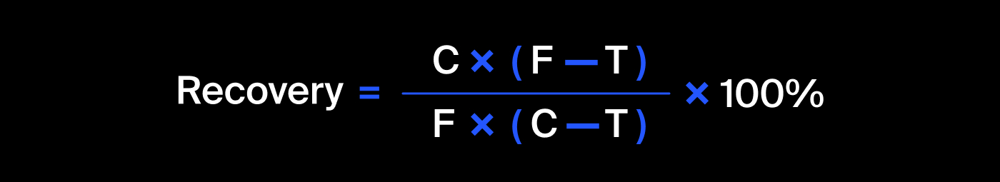

где:<br>

C — доля золота в концентрате после флотации/очистки;<br>
F — доля золота в сырье/концентрате до флотации/очистки;;<br>
T — доля золота в отвальных хвостах после флотации/очистки.

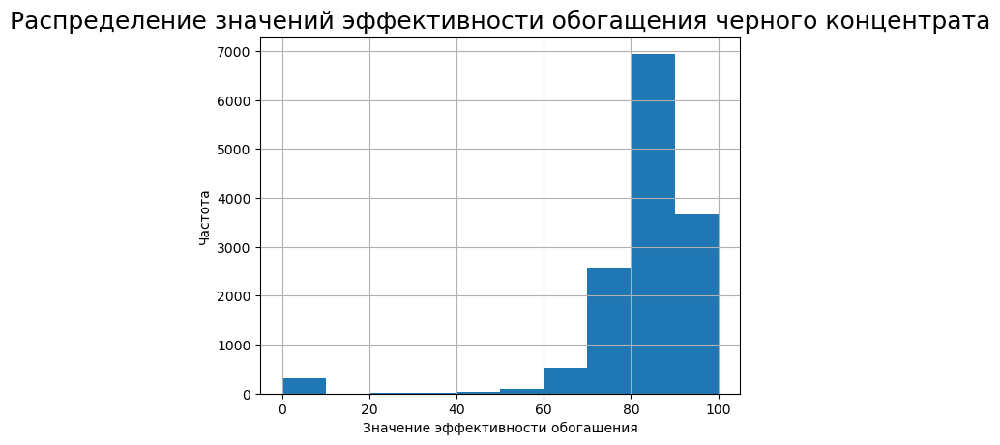

In [9]:
gold_recovery_train['rougher.output.recovery'].hist()
plt.title('Распределение значений эффективности обогащения черного концентрата', fontsize=18)
plt.xlabel("Значение эффективности обогащения")
plt.ylabel("Частота")
plt.show()

In [10]:
gold_recovery_train[gold_recovery_train['rougher.output.recovery'] <= 0]['rougher.output.recovery'].count()

297

Данных эффективности обогащения на этапе флотации равных нулю не так уж много, можно удалить.

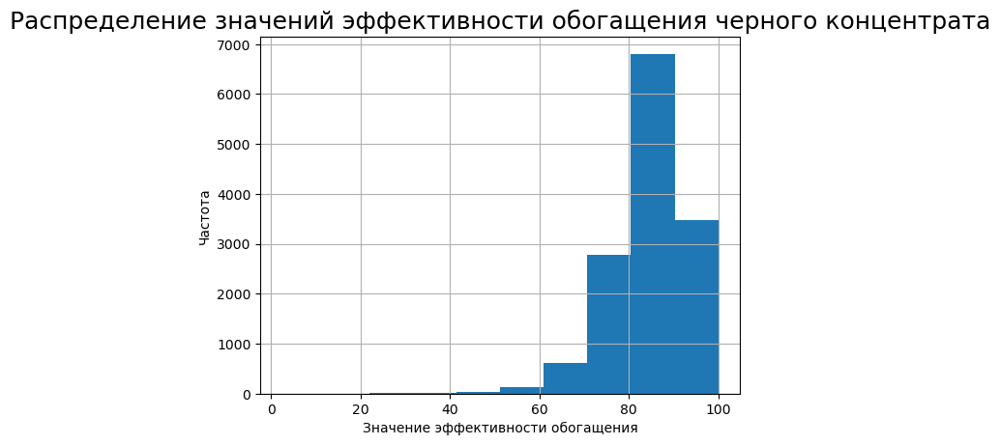

In [11]:
gold_recovery_train = gold_recovery_train[gold_recovery_train['rougher.output.recovery'] > 0]
gold_recovery_train['rougher.output.recovery'].hist()
plt.title('Распределение значений эффективности обогащения черного концентрата', fontsize=18)
plt.xlabel("Значение эффективности обогащения")
plt.ylabel("Частота")
plt.show()

In [12]:
def get_recovery(row):
    try:
        c = row['rougher.output.concentrate_au']
        f = row['rougher.input.feed_au']
        t = row['rougher.output.tail_au']
        row['rougher.output.recovery_calc'] = ((c * (f - t)) / (f * (c - t))) * 100
    except ZeroDivisionError:
        return row
    return row

In [13]:
gold_recovery_train = gold_recovery_train.apply(get_recovery,axis=1)
gold_recovery_train['rougher.output.recovery_calc'].head()

0    87.107763
1    86.843261
2    86.842308
3    87.226430
4    86.688794
Name: rougher.output.recovery_calc, dtype: float64

Найдём MAE между нашими расчётами и значением признака.

In [14]:
mae = mean_absolute_error(gold_recovery_train['rougher.output.recovery'], gold_recovery_train['rougher.output.recovery_calc'])
'{0:.20f}'.format(mae)

'0.00000000000000994385'

**Вывод**<br>
Ошибка стремится к нулю. Значит расчеты в предоставленном датасете и наши совпадают. Удалим ненужную колонку.

In [15]:
gold_recovery_train = gold_recovery_train.drop('rougher.output.recovery_calc', axis=1)

###  Анализ признаков, недоступных в тестовой выборке

In [16]:
missing_columns = set(gold_recovery_train.columns)-set(gold_recovery_test.columns)
missing_columns

{'final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.ta

1. В основном отсутствующие признаки это "отвальные хвосты" (`tail`) и концентраты (`concentrate`) на всех этапах. 
2. В тестовой выборке недоступны некоторые расчетные (`calculation`) и выходные (`output`) характеристики процесса, т.к. их невозможно получить/измерить во время выполнения технологического процесса. 
3. Отсутвуют так же оба целевых признака, которые необходимо будет найти `rougher.output.recovery`, `final.output.recovery`. 

###   Предобработка данных

Для расчте эффективности из обучающей выборки уже были удалены пропуски в колонке `rougher.output.recovery`. Проверим, какие ще знаечния пропущены.

In [17]:
gold_recovery_test.isnull().sum().sort_values(ascending=False).head(10)

rougher.input.floatbank11_xanthate          25
rougher.input.feed_sol                      21
secondary_cleaner.state.floatbank3_a_air     9
rougher.input.floatbank11_sulfate            8
primary_cleaner.input.depressant             5
rougher.input.floatbank10_sulfate            5
primary_cleaner.input.xanthate               4
primary_cleaner.input.sulfate                4
rougher.input.feed_rate                      3
secondary_cleaner.state.floatbank2_a_air     3
dtype: int64

In [18]:
#gold_recovery_test = gold_recovery_test.dropna()
#gold_recovery_test.isnull().sum()

In [19]:
gold_recovery_train.isnull().sum().sort_values(ascending=False).head(10)

secondary_cleaner.output.tail_sol           1593
rougher.input.floatbank11_xanthate           405
rougher.state.floatbank10_e_air              375
primary_cleaner.output.concentrate_sol       282
secondary_cleaner.state.floatbank2_a_air     215
final.output.concentrate_sol                 209
rougher.input.feed_size                      144
rougher.input.feed_pb                        100
final.output.tail_pb                         100
primary_cleaner.input.xanthate                97
dtype: int64

In [20]:
#gold_recovery_train = gold_recovery_train.dropna()

В условиях указано, что соседние по времени параметры часто похожи. Для заполнения отсутствующих данных в обучающих признаках воспользуемся методом «ffill», он означает «прямое заполнение» и будет распространять последнее действительное наблюдение вперед. При этом наиболее правильным будет заполнить общий датасет, т.к. в нем содержатся все данные, идущие друг за другом, а далее эти же данные записать в обучающую и тестовую выборки.

Проверим, что даные похожи, сравнив соседние знаечния кажого признака.

In [21]:
gold_recovery_train.sort_values(by='date', inplace=True)
gold_recovery_test.sort_values(by='date', inplace=True)
gold_recovery_full.sort_values(by='date', inplace=True)

df_shifted = gold_recovery_full.drop('date', axis = 1).shift(1)
df_shifted = df_shifted[~(gold_recovery_full == 0).any(axis = 1)].dropna()
display((df_shifted/gold_recovery_full.loc[df_shifted.index][df_shifted.columns]).describe().T)


,count,mean,std,min,25%,50%,75%,max
final.output.concentrate_ag,15058.0,1.009465e+00,1.929796e-01,0.000000e+00,0.958031,1.001261,1.047139,1.195790e+01
final.output.concentrate_pb,15058.0,1.005996e+00,1.726809e-01,0.000000e+00,0.979445,1.000200,1.020979,1.156213e+01
final.output.concentrate_sol,15013.0,1.009820e+00,1.963267e-01,0.000000e+00,0.977076,1.000000,1.023578,1.173586e+01
final.output.concentrate_au,15059.0,1.007858e+00,2.671563e-01,0.000000e+00,0.986971,0.999640,1.012689,2.557876e+01
final.output.recovery,15059.0,1.018895e+00,1.184421e+00,0.000000e+00,0.976095,1.000115,1.025276,1.374445e+02
final.output.tail_ag,15059.0,1.033190e+00,1.392442e+00,0.000000e+00,0.979622,0.999527,1.020073,1.114171e+02
final.output.tail_pb,15056.0,1.037949e+00,1.542116e+00,0.000000e+00,0.960828,0.999659,1.040337,1.332115e+02
final.output.tail_sol,15057.0,1.040066e+00,1.476538e+00,0.000000e+00,0.973269,0.999546,1.026385,1.288878e+02
final.output.tail_au,15059.0,1.041166e+00,1.705496e+00,0.000000e+00,0.957556,1.000496,1.047290,1.595528e+02
primary_cleaner.input.sulfate,15055.0,1.019822e+00,6.894254e-01,1.889993e-01,0.971109,0.999871,1.029614,7.561853e+01


Среднее значение отношения соседних величин в районе 1 у большинства признаков, значит сосодение строки дейтсвительно похожи.

In [22]:
# установим даты  в качетсве индекса во всех датасетах
gold_recovery_train = gold_recovery_train.set_index('date')
gold_recovery_test = gold_recovery_test.set_index('date')
gold_recovery_full = gold_recovery_full.set_index('date')
# найдем пример для проверки верности заполнения
gold_recovery_full[gold_recovery_full['secondary_cleaner.output.tail_sol'].isna()].head()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-04-01 08:00:00,9.943401,7.542210,NaN,43.050052,5.982863,11.186132,1.037645,4.265981,2.877984,24.991930,3.036741,5.73,0.315188,6.592289,5.321763,9.355665,31.969794,17.217789,2.844502,1.689113,4.552381,1599.794125,-400.268817,1602.082199,-399.219507,1594.763405,-400.379657,886.455766,-399.807225,229457.583264,8798.170504,8797.683195,-0.000437,7.480951,NaN,176.819859,55.244951,NaN,3.048159,3.996756,2.495699,3.994954,2.497911,8.735538,7.033525,9.011418,16.534931,40.926351,4.131907,0.862082,12.227496,1.947598,1000.680318,-499.638552,1599.466198,-500.336605,1599.997266,-500.942177,1590.452607,-501.285175,1399.846688,-502.418868,1300.314943,-499.924685,15.059629,4.557117,NaN,3.795325,30.012126,-499.046895,28.059696,-499.131792,27.050829,-500.250576,24.992993,-501.234077,12.033748,-503.870685,11.956217,-501.172007,12.137367,-499.381630,10.019826,-499.559743,19.983178,-500.131499
2016-04-01 09:00:00,8.254964,7.972211,NaN,43.818753,15.662743,11.107211,1.131023,5.198314,2.99389

Для проверки возьмем строку c индексом 2016-04-01 08:00:00. Выведем несколько строк в этом диапазоне.	

In [23]:
gold_recovery_full.loc['2016-03-29 01:00:00':'2016-04-01 11:00:00', 'secondary_cleaner.output.tail_sol']

date
2016-03-29 01:00:00    11.823058
2016-04-01 08:00:00          NaN
2016-04-01 09:00:00          NaN
2016-04-01 10:00:00          NaN
Name: secondary_cleaner.output.tail_sol, dtype: float64

При верной отработке методом ffill в строке 1616 в столбце 'secondary_cleaner.output.tail_sol' должно появиться значение 11.823058.

In [24]:
train_columns = gold_recovery_train.columns.tolist()
train_columns.remove('final.output.recovery')
train_columns.remove('rougher.output.recovery')

In [25]:
gold_recovery_full[train_columns].isnull().sum().sum()

4481

In [26]:
gold_recovery_full[train_columns] = gold_recovery_full[train_columns].ffill(axis = 0) # заполняем только по обучающим признакам
gold_recovery_full['secondary_cleaner.output.tail_sol']['2016-04-01 08:00:00'] == gold_recovery_full['secondary_cleaner.output.tail_sol']['2016-03-29 01:00:00']

True

In [27]:
gold_recovery_full[train_columns].isnull().sum().sum()

0

Видим, что пропуски в обучающих признаках заполнены корректно. Выполним заполнение данных в остальных датасетах. Для этого в качестве индекса сделаем столбы с датами во всех датасетах и заполним пропуски методом update.

In [28]:
# найдем NaN в обучающей выборке
gold_recovery_train[gold_recovery_train['primary_cleaner.input.xanthate'].isnull()].head(5)

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-21 10:00:00,5.782224,10.969985,9.301260,43.181003,74.257359,11.959760,2.064173,15.139256,3.091437,NaN,NaN,7.25,NaN,11.345656,9.424562,20.275368,31.333106,17.514891,3.971093,7.845526,3.162975,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.367651,12.028591,4.203939,NaN,NaN,41.782570,9.953462,NaN,NaN,NaN,NaN,13.678706,7.790201,28.779023,19.650397,86.217222,6.055658,0.862177,19.770304,2.435464,NaN,NaN,NaN,NaN,NaN,NaN,1393.735867,-501.357678,1196.516363,-505.322143,1097.010735,-499.416892,16.134409,5.427901,12.116604,3.259027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-24 08:00:00,5.007247,11.578059,NaN,42.781376,56.583361,11.082708,1.861959,15.407046,3.436111,104.956422,11.999398,7.37,NaN,5.645187,9.975369,11.046939,40.294337,16.358718,3.683974,7.641395,4.810610,1597.697640,-399.819202,1596.949702,-399.888695,1600.157805,-399.248583,628.944024,-399.876977,47943.958029,3290.898925,3288.052633,2.747278,8.112402,2.607796,460.979733,46.8

Для проверки возьмем строку с индексом `2016-03-24 08:00:00`.

In [29]:
gold_recovery_full.loc['2016-03-24 08:00:00', 'secondary_cleaner.output.tail_sol']

10.411911146905688

В случае успешного заполнения в строке с индексом `2016-03-24 08:00:00` в столбце `primary_cleaner.input.xanthate` должно появиться верное значение 10.411911146905688.

In [30]:
gold_recovery_train.isnull().sum().sum()

3981

In [31]:
gold_recovery_train.update(gold_recovery_full)
gold_recovery_train['primary_cleaner.input.xanthate']['2016-03-24 08:00:00'] == gold_recovery_full['primary_cleaner.input.xanthate']['2016-03-24 08:00:00']

True

In [32]:
gold_recovery_train.isnull().sum().sum()

0

Пропуски в обучающей выборке заполнены корректно,  аналогично заполним тестовую выборку.

In [33]:
gold_recovery_test.isnull().sum().sum()

90

In [34]:
gold_recovery_test.update(gold_recovery_full)
gold_recovery_test.isnull().sum().sum()

0

### Вывод

1. В тестовой выборке тесте нет 34 колонок из обущающей выборки, из них 2 колонки это целевой признак (final.output.recovery, rougher.output.recovery), остальные признаки:
- выходные концентрации веществ на этапах (rougher/primary_cleaner/final.output.concentrate_хх) - 12 колонок;
- выходные концентрации отвальных хвостов на всех этапах (rougher/primary_cleaner/secondary_cleaner/final.output.tail_хх) - 16 колонок;
- расчетны характеристики на этапе флотации 4 колонки:(rougher.calculation.au_pb_ratio/floatbank10_sulfate_to_au_feed/floatbank11_sulfate_to_au_feed/sulfate_to_au_concentrate).

2. При проверке расчета эффективности ошибка стремится к нулю. Значит расчеты в предоставленном датасете и наши совпадают. 
3. В тестовой и обучающей выборке пропущенные значенения признаков заполнены из сосдених строк. 

## Анализ данных

### Изменение концентрации металлов (Au, Ag, Pb) на различных этапах очистки

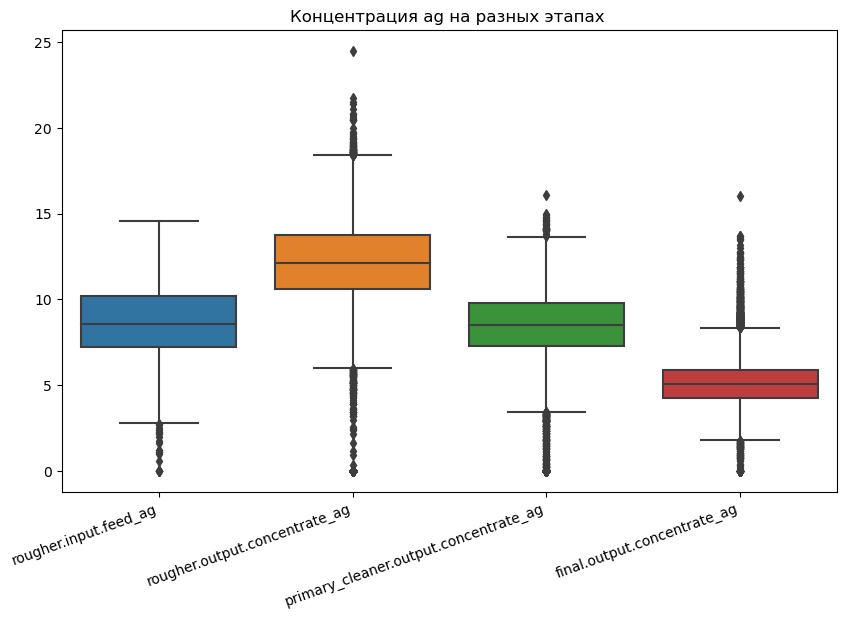

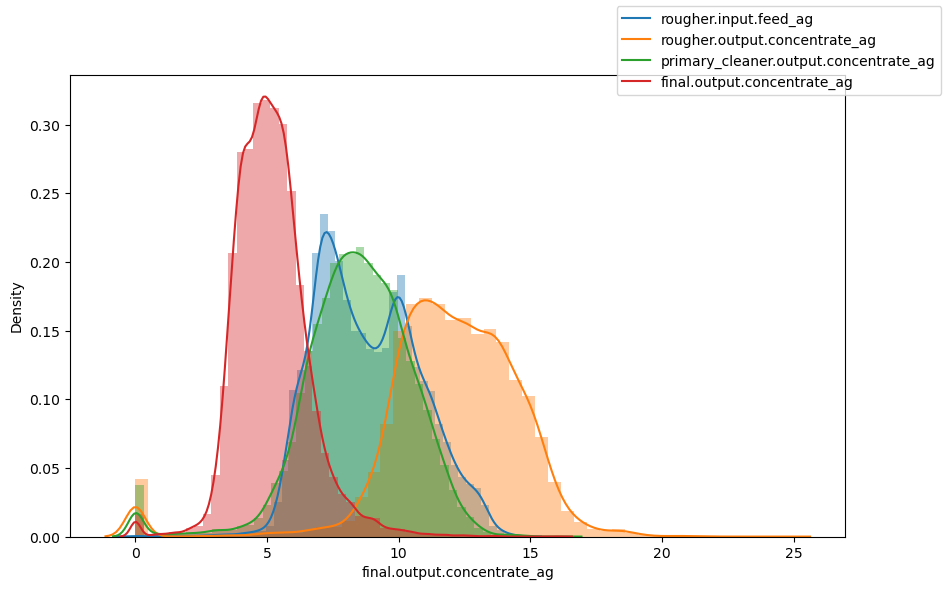

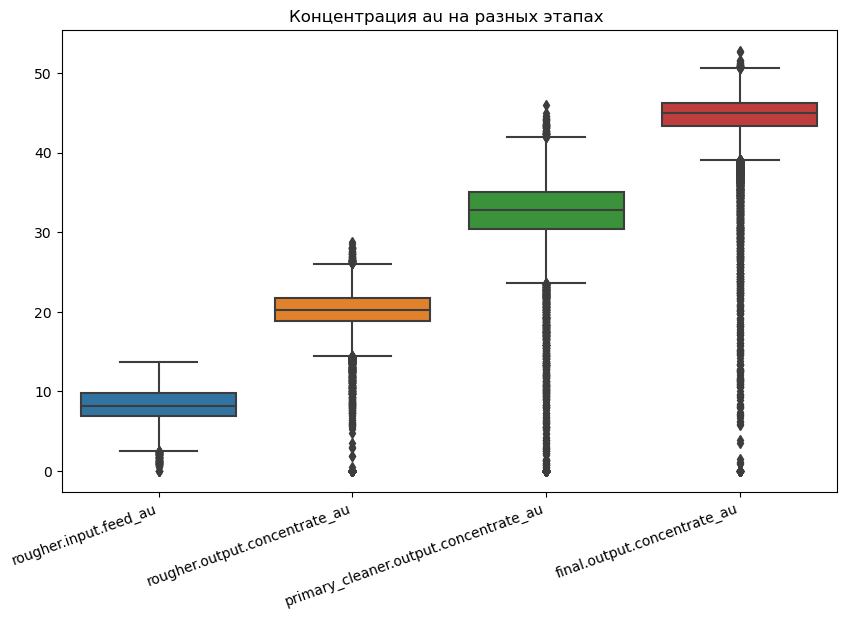

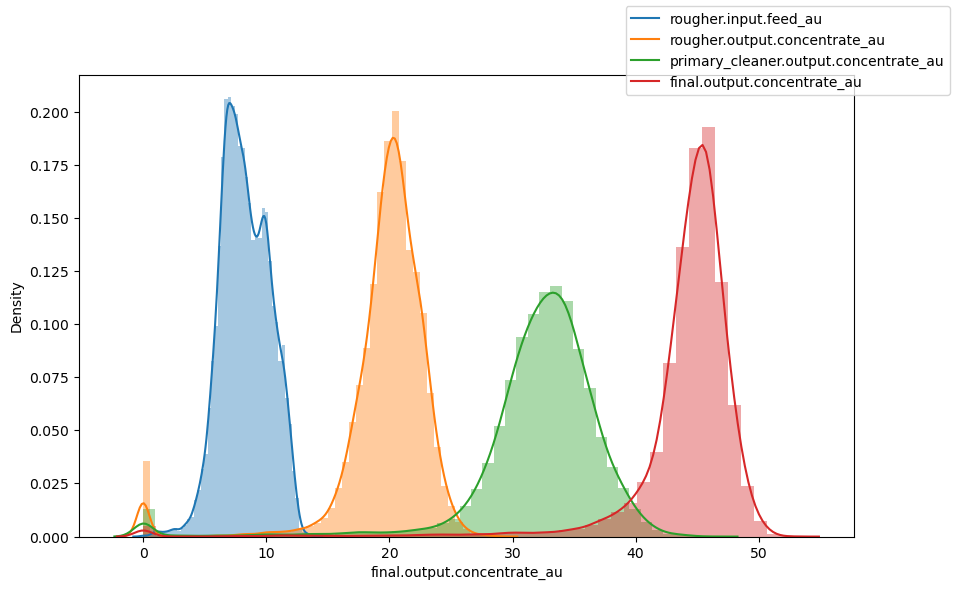

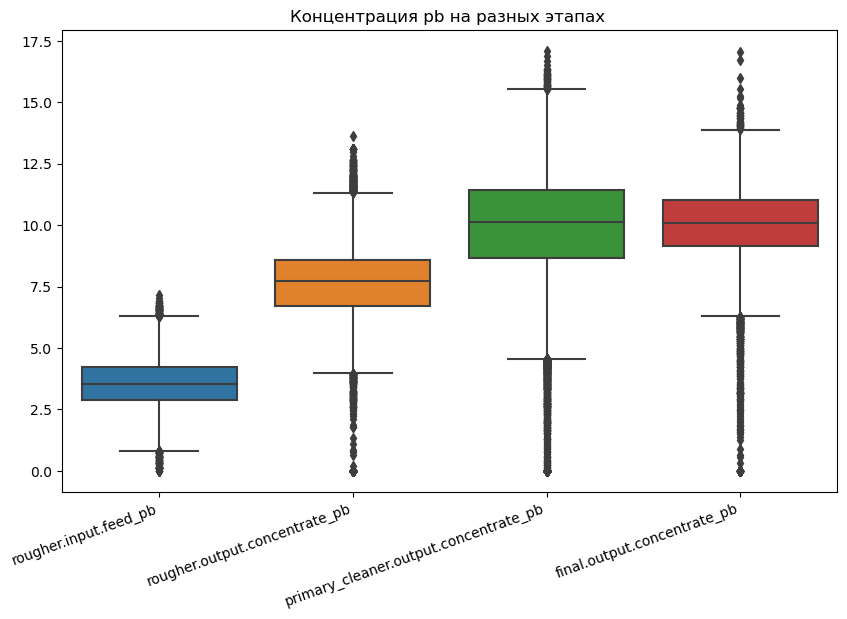

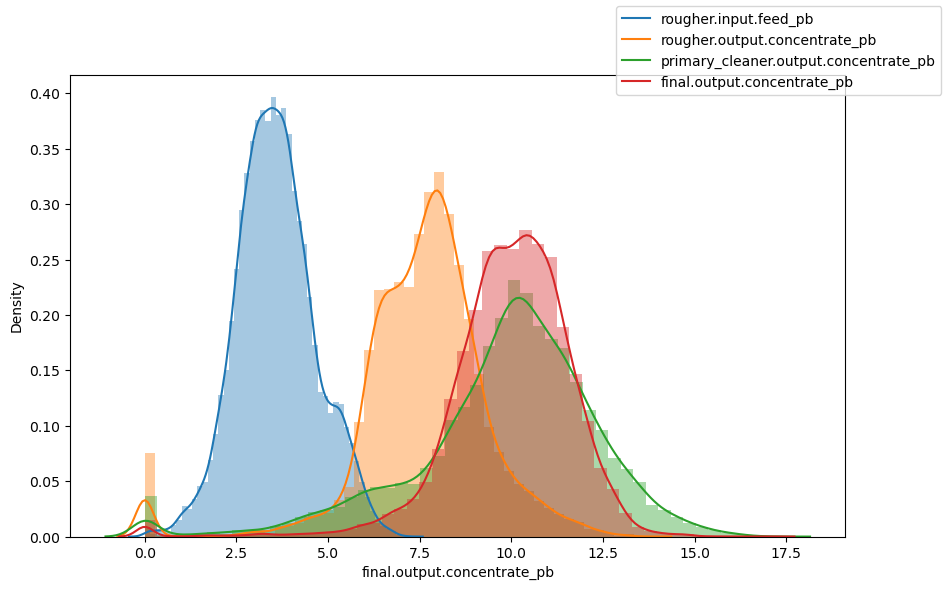

In [35]:
concentrate = {'ag':['rougher.input.feed_ag', 'rougher.output.concentrate_ag', 'primary_cleaner.output.concentrate_ag', 'final.output.concentrate_ag' ],
               'au':['rougher.input.feed_au', 'rougher.output.concentrate_au', 'primary_cleaner.output.concentrate_au', 'final.output.concentrate_au' ],
               'pb':['rougher.input.feed_pb', 'rougher.output.concentrate_pb', 'primary_cleaner.output.concentrate_pb', 'final.output.concentrate_pb' ]}

for key in concentrate:
    plt.figure(figsize=(10,6))
    sns.boxplot(data = gold_recovery_full[concentrate[key]]).set_title(f'Концентрация {key} на разных этапах ')
    plt.xticks(rotation = 20, ha='right')
    
    fig = plt.figure(figsize=(10,6))
    sns.distplot(gold_recovery_full[concentrate[key][0]])
    sns.distplot(gold_recovery_full[concentrate[key][1]])
    sns.distplot(gold_recovery_full[concentrate[key][2]])
    sns.distplot(gold_recovery_full[concentrate[key][3]])
    fig.legend(gold_recovery_full[concentrate[key]])

    plt.show()

Опишем изменения концентраций каждого материала в зависимости от этапа.

**AU** - золото. Концентрация золота закономерно возрастает от начального к конечному этапу - средние значения на финальном этапе находятся в районе 45 %, а это является самой большой величиной в концентрате. Изменение боксплотов закономерно показывает, что процесс идет успешно.

**AG** - серебро. Концентрация серебра планомерно снижается в процессе обогащения, скорей всего происходит его вымывание из раствора на различных стадиях процесса. На финальном этапе среднее значение концентрации данного материала составляет около 5 %.

**PB** - свинец. Концентрация свинца меняется незначительно в процессе обогащения, средние значения изменяются от 7.5 до 10 %. Предположительно, в процессе первичной очистки в раствор искусственно добавляется данный материал и далее не меняется.

### Сравнение распределения размеров гранул сырья на обучающей и тестовой выборках

#### Сравнение размеров гранул сырья до флотации

In [36]:
def copmare_feed_size (feed_size_train, feed_size_test):
    plt.figure(figsize=(15,10), dpi= 80)
    sns.kdeplot(feed_size_train, shade=True, color="g", label="test", alpha=.5)
    sns.kdeplot(feed_size_test, shade=True, color="deeppink", label="train", alpha=.5)
    plt.title('Распределения размеров гранул сырья на обучающей и тестовой выборках', fontsize=22)
    plt.legend()
    plt.show()
    print('Описание гранул в обучающей выборке:')
    print(feed_size_train.describe())
    print('Описание гранул в тестовой выборке:')
    print(feed_size_test.describe())

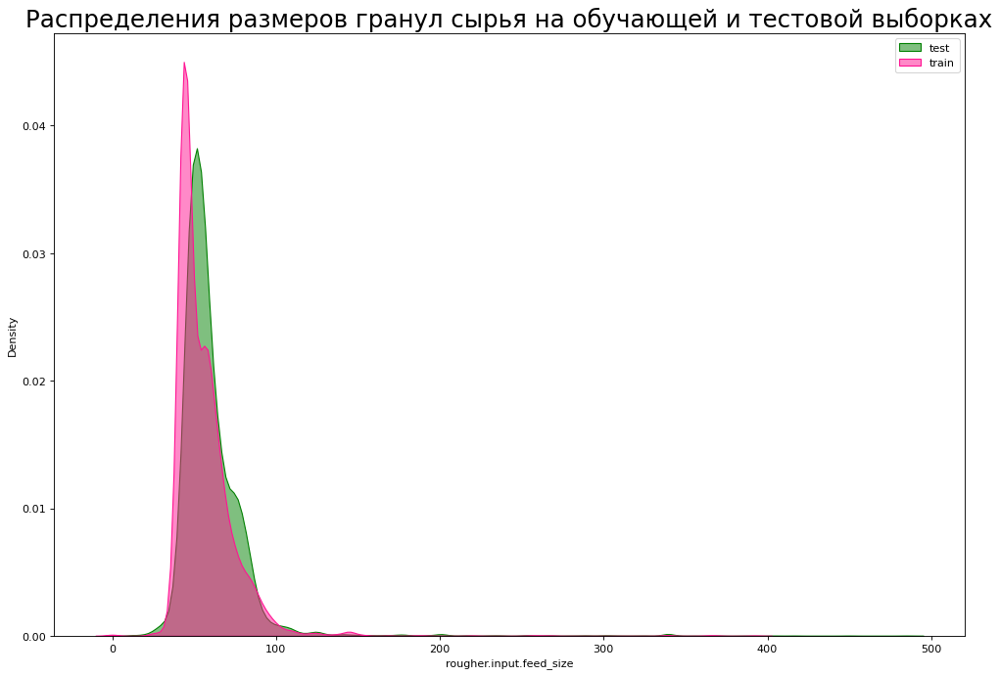

Описание гранул в обучающей выборке:
count    13852.000000
mean        60.250726
std         23.079496
min          9.659576
25%         48.985014
50%         55.301718
75%         65.961839
max        484.967466
Name: rougher.input.feed_size, dtype: float64
Описание гранул в тестовой выборке:
count    5290.000000
mean       55.952754
std        19.080334
min         0.046369
25%        43.906504
50%        50.846843
75%        62.451165
max       392.494040
Name: rougher.input.feed_size, dtype: float64


In [37]:
copmare_feed_size (gold_recovery_train['rougher.input.feed_size'], gold_recovery_test['rougher.input.feed_size'])

По графику видно, что распределение обучающей и тестовой выборки можно считать близкими по значению, что они практически совпадают.

#### Сравнение размеров гранул сырья перед  первым этапом очистки

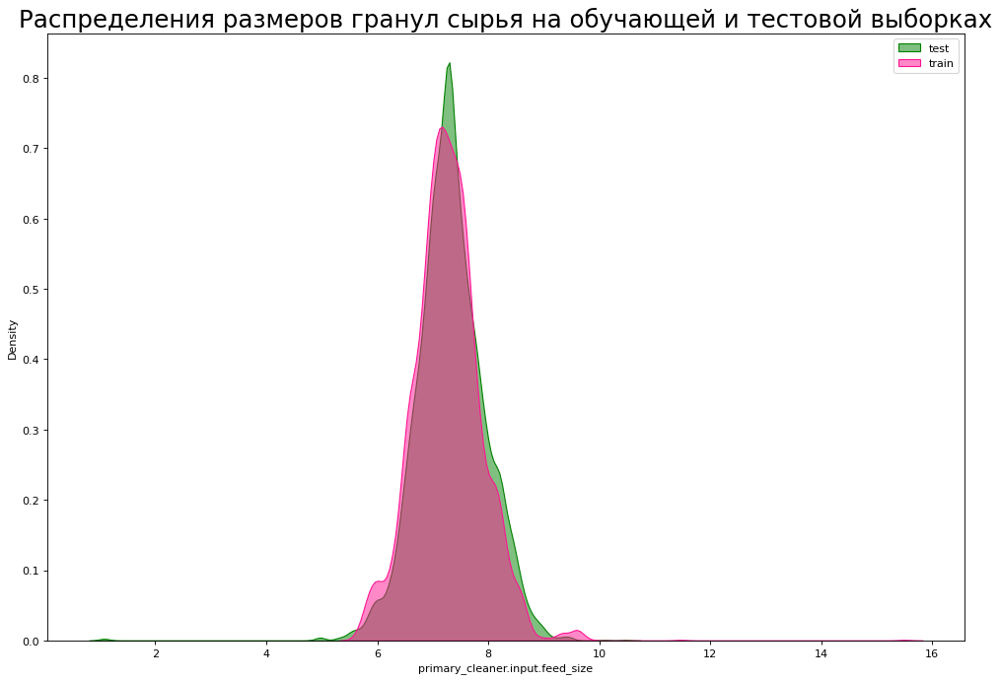

Описание гранул в обучающей выборке:
count    13852.000000
mean         7.323509
std          0.616779
min          1.080000
25%          6.960000
50%          7.300000
75%          7.700000
max         10.470000
Name: primary_cleaner.input.feed_size, dtype: float64
Описание гранул в тестовой выборке:
count    5290.000000
mean        7.266339
std         0.610219
min         5.650000
25%         6.890000
50%         7.250000
75%         7.600000
max        15.500000
Name: primary_cleaner.input.feed_size, dtype: float64


In [38]:
copmare_feed_size (gold_recovery_train['primary_cleaner.input.feed_size'], gold_recovery_test['primary_cleaner.input.feed_size'])

По графику видно, что распределение обучающей и тестовой выборки можно считать близкими по значению, что они практически совпадают.

### Cуммарная концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах

#### Сумма концентраций металлов после финальной очистки

In [39]:
final_output_concentrate_sum = gold_recovery_train[['final.output.concentrate_au',
                                                    'final.output.concentrate_ag',
                                                    'final.output.concentrate_pb']].sum(axis=1)

#### Сумма концентраций металлов после первичной очистки

In [40]:
primary_cleaner_output_concentrate_sum = gold_recovery_train[['primary_cleaner.output.concentrate_au',
                                                              'primary_cleaner.output.concentrate_ag',
                                                              'primary_cleaner.output.concentrate_pb']].sum(axis=1)

#### Сумма концентраций металлов после флотации

In [41]:
rougher_output_concentrate_sum = gold_recovery_train[['rougher.output.concentrate_au',
                                                      'rougher.output.concentrate_ag',
                                                      'rougher.output.concentrate_pb']].sum(axis=1)

#### Сумма концентраций в исходном сырье

In [42]:
rougher_input_concentrate_sum = gold_recovery_train[['rougher.input.feed_au',
                                                      'rougher.input.feed_ag',
                                                      'rougher.input.feed_pb']].sum(axis=1)

#### Графики суммарных концентраций

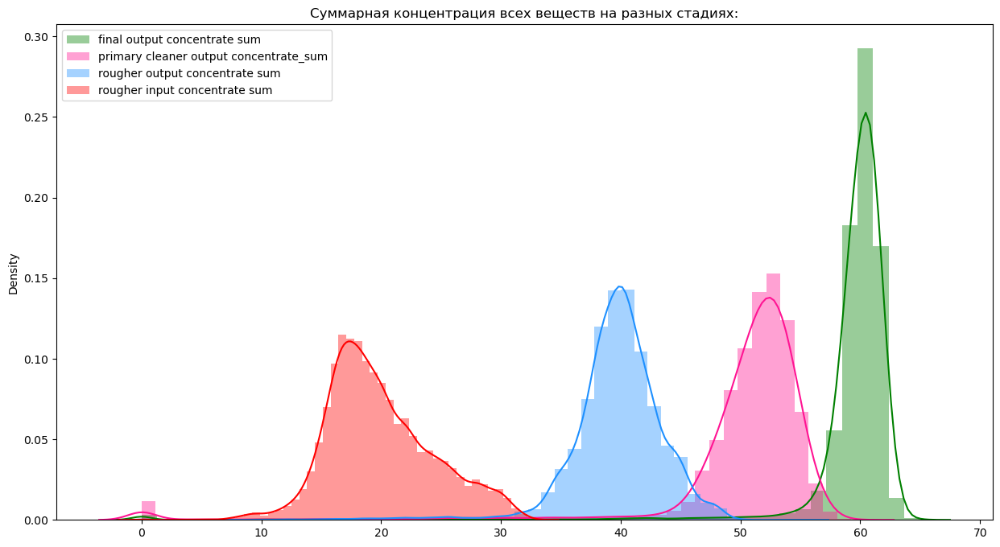

In [43]:
plt.figure(figsize=(15,8))
sns.distplot(final_output_concentrate_sum, label='final output concentrate sum', color="g")
sns.distplot(primary_cleaner_output_concentrate_sum, color="deeppink",label='primary cleaner output concentrate_sum')
sns.distplot(rougher_output_concentrate_sum, color="dodgerblue",label='rougher output concentrate sum')
sns.distplot(rougher_input_concentrate_sum, color="r",label='rougher input concentrate sum')

plt.title('Суммарная концентрация всех веществ на разных стадиях:')
plt.legend()
plt.show()

In [44]:
fig = go.Figure()
for x in [final_output_concentrate_sum, primary_cleaner_output_concentrate_sum, rougher_output_concentrate_sum, rougher_input_concentrate_sum]:
    fig.add_trace(go.Box(x=x, showlegend=False))

fig.update_layout(
    autosize=False,
    width=850,
    height=500)

Из диаграммы боксплот видно большое количество выборос концентрации металлов. Уберем значения в нуле: будем считать всплеск в раойне0 - аномалией.

In [45]:
corr_concentrate_sum = [
    rougher_input_concentrate_sum[rougher_input_concentrate_sum > 0],
    rougher_output_concentrate_sum[rougher_output_concentrate_sum > 0],
    primary_cleaner_output_concentrate_sum[primary_cleaner_output_concentrate_sum > 0],
    final_output_concentrate_sum[final_output_concentrate_sum > 0]
]

In [46]:
fig = go.Figure()
for x in corr_concentrate_sum:
    fig.add_trace(go.Box(x=x, showlegend=False))

fig.update_layout(
    autosize=False,
    width=850,
    height=500)

In [47]:
gold_recovery_train.shape

(13852, 86)

In [48]:
gold_recovery_train = gold_recovery_train[(rougher_output_concentrate_sum > 0) 
                                          & (primary_cleaner_output_concentrate_sum>0) 
                                          & (final_output_concentrate_sum)
                                          & (rougher_input_concentrate_sum)] 
gold_recovery_train.shape

(13725, 86)

**Вывод**
1. Суммарная концентрация веществ увеличивается с течением процесса обогащения (колокол как бы сдвигается вправо по шкале), что закономерно, т.к. при обработке вымываются лишние примеси и подсадочные реагенты.
2. Замечены колебания при нулевых значениях, для первичной очистки это проявляется существенно, для остальных стадий - незначительно. Скорей эти значения получены в те моменты времени когда производственный процесс по каким-либо причинам был остановлен, поэтому такие строки удалили из датасетов.

## Модель

### Функция для вычисления итоговой sMAPE

Формула для sMAPE (Symmetric Mean Absolute Percentage Error, симметричное среднее абсолютное процентное отклонение):

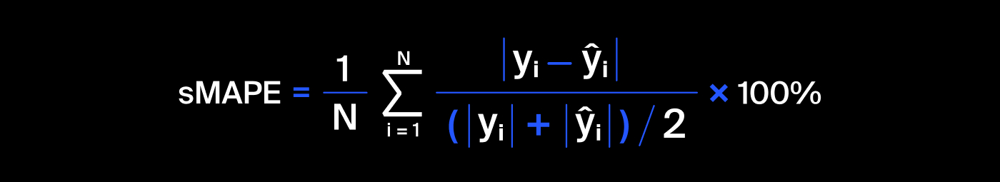





In [49]:
def smape(target, predictions):
    numerator = abs(predictions - target)
    divider = (abs(target) + abs(predictions)) / 2
    summa = (numerator / divider).sum()

    smape = (1 / len(target)) * summa * 100
    return smape

Итоговая метрика складывается из двух величин:

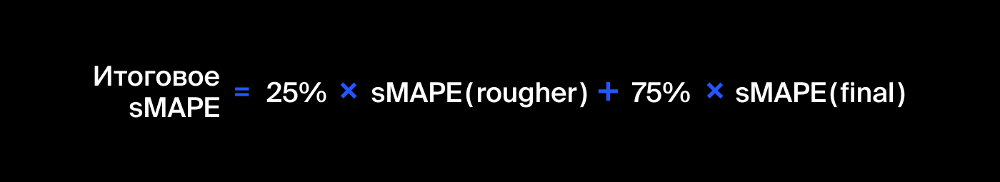

In [50]:
def smapefinal(rougher, final):
    return (0.25 * rougher + 0.75 * final)
     

### Обучим разные модели и оценим их качество кросс-валидацией

Удалим из обучающей выборки колонки, осуствующие в тестовой выборке.

In [51]:
gold_recovery_train.drop(missing_columns, axis=1, inplace=True)

Добавим target из исходных данных в обучающую и тестовую выборки:

In [52]:
train = gold_recovery_train.merge(gold_recovery_full[[ 'rougher.output.recovery', 'final.output.recovery']], 
                        how = 'left', left_index=True, right_index=True)
test = gold_recovery_test.merge(gold_recovery_full[[ 'rougher.output.recovery', 'final.output.recovery']], 
                        how = 'left', left_index=True, right_index=True)

In [53]:
train.shape, test.shape

((13725, 54), (5290, 54))

Разделим выборки на признаки.

In [54]:
#обучающая выборка
target_train = train[['rougher.output.recovery', 'final.output.recovery']]
features_train = train.drop(['rougher.output.recovery', 'final.output.recovery'], axis=1)

# тестовая выборка
target_test = test[['rougher.output.recovery','final.output.recovery']]
features_test = test.drop(['rougher.output.recovery', 'final.output.recovery'], axis=1)

Используем функцию `make_scorer` для преобразования метрик в вызываемые объекты, которые можно использовать для оценки модели.

In [55]:
custom_score =  make_scorer(smape,greater_is_better=False)

In [56]:
model_RFR = RandomForestRegressor(random_state=12345)
model_Ridge = Ridge(random_state=12345)
model_Neighbors = KNeighborsRegressor()

In [57]:
# Инициализация параметров для GridSearchCV
params_RFR = {"n_estimators":[50, 120, 230],
             "max_depth":range(5, 7)}
params_Ridge = {'alpha':[0, 1, 1.2, 5, 20],
                'solver':['svd', 'cholesky', 'sparse_cg', 'lsqr']}
params_Neighbors = {'n_neighbors':[5, 20],
                                'algorithm':['ball_tree', 'kd_tree', 'brute'],
                                'p':[1, 2]}

In [58]:
model_Neighbors.get_params().keys()

dict_keys(['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'])

In [59]:
grid_rougher_RFR = GridSearchCV(model_RFR, param_grid = params_RFR, scoring=custom_score)
grid_final_RFR = GridSearchCV(model_RFR, param_grid = params_RFR, scoring=custom_score)

grid_rougher_Ridge = GridSearchCV(model_Ridge, param_grid = params_Ridge, scoring=custom_score)
grid_final_Ridge = GridSearchCV(model_Ridge, param_grid = params_Ridge, scoring=custom_score)

grid_rougher_Neighbors = GridSearchCV(model_Neighbors, param_grid = params_Neighbors, scoring=custom_score)
grid_final_Neighbors = GridSearchCV(model_Neighbors, param_grid = params_Neighbors, scoring=custom_score)

Обучение

In [60]:
grid_rougher_RFR.fit(features_train, target_train['rougher.output.recovery'])
grid_final_RFR.fit(features_train, target_train['final.output.recovery'])

grid_rougher_Ridge.fit(features_train, target_train['rougher.output.recovery'])
grid_final_Ridge.fit(features_train, target_train['final.output.recovery'])

grid_rougher_Neighbors.fit(features_train, target_train['rougher.output.recovery'])
grid_final_Neighbors.fit(features_train, target_train['final.output.recovery'])

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [5, 20], 'p': [1, 2]},
             scoring=make_scorer(smape, greater_is_better=False))

In [61]:
print("Лучшие модели")
print(grid_rougher_RFR.best_params_)
print(grid_final_RFR.best_params_)
print(grid_rougher_Ridge.best_params_)
print(grid_final_Ridge.best_params_)
print(grid_rougher_Neighbors.best_params_)
print(grid_final_Neighbors.best_params_)

Лучшие модели
{'max_depth': 5, 'n_estimators': 230}
{'max_depth': 5, 'n_estimators': 120}
{'alpha': 0, 'solver': 'lsqr'}
{'alpha': 20, 'solver': 'sparse_cg'}
{'algorithm': 'ball_tree', 'n_neighbors': 20, 'p': 1}
{'algorithm': 'ball_tree', 'n_neighbors': 20, 'p': 1}


Определим лучшую модель для каждого целевого признака

In [62]:
best_score_rougher_RFR = grid_rougher_RFR.best_score_
best_score_final_RFR = grid_final_RFR.best_score_
best_score_rougher_Ridge = grid_rougher_Ridge.best_score_
best_score_final_Ridge = grid_final_Ridge.best_score_
best_score_rougher_Neighbors = grid_rougher_Neighbors.best_score_
best_score_final_Neighbors = grid_final_Neighbors.best_score_

In [63]:
print("rougher")
print("RandomForest",best_score_rougher_RFR*(-1),"Ridge",best_score_rougher_Ridge*(-1), "Neighbors",best_score_rougher_Neighbors*(-1))
print("final")
print("RandomForest",best_score_final_RFR*(-1),"Ridge",best_score_final_Ridge*(-1), "Neighbors",best_score_final_Neighbors*(-1))

rougher
RandomForest 6.608695918928291 Ridge 6.314658653770562 Neighbors 8.477472883507675
final
RandomForest 9.121410056876767 Ridge 10.568096186532514 Neighbors 11.574133265613504


Видно, что лучше всего справляется Random Forest Regression, так что как лучшую модель возьмем именно его.

Финальный sMAPE случайного леса:

In [64]:
smapefinal(best_score_rougher_RFR*(-1),best_score_final_RFR*(-1))

8.493231522389648

Финальный sMAPE решающего дерева

In [65]:
smapefinal(best_score_rougher_Ridge*(-1),best_score_final_Ridge*(-1))

9.504736803342027

Финальный  sMAPE линейной регрессии:

In [66]:
smapefinal(best_score_rougher_Neighbors*(-1),best_score_final_Neighbors*(-1))

10.799968170087046

В качетсве лучше модели возьму модель  случайного  леса.

### Выберем лучшую модель и проверим её на тестовой выборке

In [67]:
rogher_test = grid_rougher_RFR.predict(features_test)

In [68]:
final_test = grid_final_RFR.predict(features_test)

In [69]:
smapefinal(smape(target_test['rougher.output.recovery'],rogher_test), smape(target_test['final.output.recovery'],final_test))

9.394872627243458

#### Создадим константную модель и сравним ее с нашей

In [70]:
dr_mean = DummyRegressor(strategy="mean")
dr_median = DummyRegressor(strategy="median")

In [71]:
dr_mean.fit(features_train, target_train['rougher.output.recovery'])
preds_rough = dr_mean.predict(features_test)

dr_mean.fit(features_train, target_train['final.output.recovery'])
preds_final = dr_mean.predict(features_test)

print("Прогноз по среднему: {:.2f}".format(smapefinal(smape(preds_rough, target_test['rougher.output.recovery']), 
           smape(preds_final, target_test['final.output.recovery']))))

Прогноз по среднему: 9.83


In [72]:
dr_median.fit(features_train, target_train['rougher.output.recovery'])
preds_rough = dr_median.predict(features_test)

dr_median.fit(features_train, target_train['final.output.recovery'])
preds_final = dr_median.predict(features_test)

print("Прогноз по медиане: {:.2f}".format(smapefinal(smape(preds_rough, target_test['rougher.output.recovery']), 
           smape(preds_final, target_test['final.output.recovery']))))

Прогноз по медиане: 9.44


Наша модель предсказывает лучше, чем константная модель по среднему (sMAPE нашей модели меньше).


<Figure size 2000x1000 with 0 Axes>

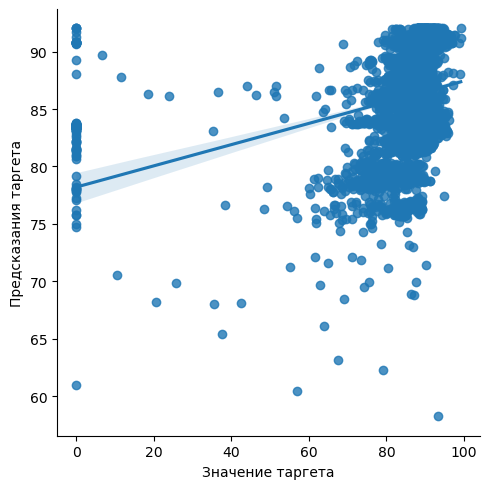

In [73]:
df_rougher = pd.DataFrame()
df_rougher['target'] = target_test['rougher.output.recovery']
df_rougher['predict'] = rogher_test
plt.figure(figsize=[20,10])
sns.lmplot(x= 'target', y='predict', data = df_rougher)


plt.xlabel("Значение таргета")
plt.ylabel("Предсказания таргета")

plt.show()

<Figure size 1500x800 with 0 Axes>

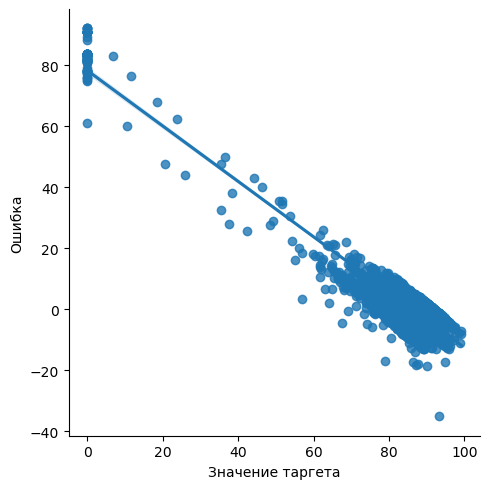

In [74]:
df_rougher['mistakes'] = df_rougher['predict'] - df_rougher['target']
plt.figure(figsize=[15,8])

sns.lmplot(x= 'target', y='mistakes', data = df_rougher)

#plt.xlim([0,1])
#plt.ylim([0,1])

plt.xlabel("Значение таргета")
plt.ylabel("Ошибка")

plt.show()

<Figure size 2000x1000 with 0 Axes>

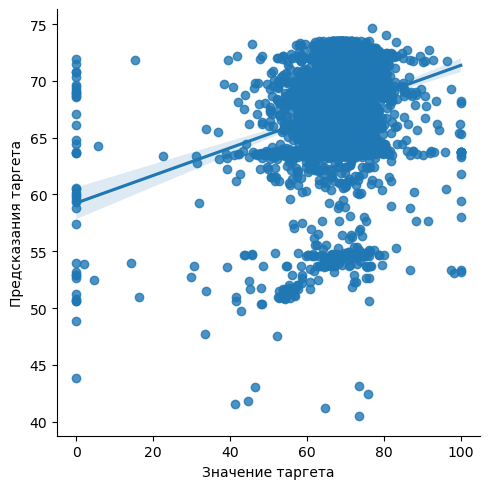

In [75]:
df_final = pd.DataFrame()
df_final['target'] = target_test['final.output.recovery']
df_final['predict'] = final_test
plt.figure(figsize=[20,10])
sns.lmplot(x= 'target', y='predict', data = df_final)


plt.xlabel("Значение таргета")
plt.ylabel("Предсказания таргета")

plt.show()

<Figure size 1500x800 with 0 Axes>

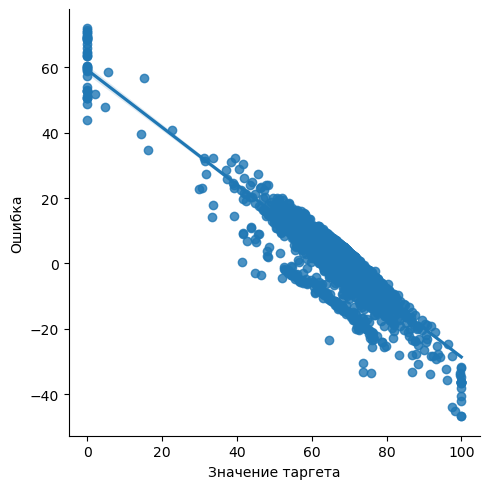

In [76]:
df_final['mistakes'] = df_final['predict'] - df_final['target']
plt.figure(figsize=[15,8])

sns.lmplot(x= 'target', y='mistakes', data = df_final)

#plt.xlim([0,1])
#plt.ylim([0,1])

plt.xlabel("Значение таргета")
plt.ylabel("Ошибка")

plt.show()

## Вывод

В ходе проекта:
1. Проверили, что эффективность обогащения рассчитана правильно, т.к. `MAE` между нашими расчётами и значением признака стремится к нулю.

2.  В тестовой выборке отсутствуют признаки, которые и невозможно получить/измерить во время выполнения технологического процесса ( "отвальные хвосты" (`tail`) и концентраты (`concentrate`) на всех этапах, некоторые расчетные (`calculation`) и выходные (`output`) характеристики процесса). Также в тестовой выборке отсутствовали целевые признаки.

3. Провели предобработку данных, удалив из исходных данных строки без целевого признака и из тествой и обучающей выборок строки с пустыми признаками.

4. Проанализировали изменение концентрация металлов (`Au`, `Ag`, `Pb`) на различных этапах очистки. На финальной стадии очень много выбросов. Больше всего выбросов наблюдается у золота как на первычной очистке, так и на финальной очистке. Еще можно выделить возрастание концентрации золота на финальной очистке.

5. При сравнении распределения размеров гранул сырья на обучающей и тестовой выборках сделали вывод, что распределение обучающей и тестовой выборки можно считать близкими по значению,  они практически совпадают.

6. Исследовали суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах. Суммарная концентрация веществ увеличивается с течением процесса обогащения (колокол как бы сдвигается вправо по шкале), что закономерно, т.к. при обработке вымываются лишние примеси и подсадочные реагенты.

7. Написали функцию для вычисления `sMAPE` (симметричного среднего абсолютного процентного отклонения).

8. Подобрали лучшую модель и оченили ее качество кросс-валидацией. Лучша модель - `RandomForestRegression`. 